In [1]:
import torchaudio
import platform

if platform.system() == "Windows":
    torchaudio.USE_SOUNDFILE_LEGACY_INTERFACE = False
    torchaudio.set_audio_backend("soundfile")
else:
    torchaudio.set_audio_backend("sox_io")

C:\Users\paess\Anaconda3\envs\temporal-speech-context\lib\site-packages\torchaudio\extension\extension.py:14: UserWarning: torchaudio C++ extension is not available.
  warnings.warn('torchaudio C++ extension is not available.')
C:\Users\paess\Anaconda3\envs\temporal-speech-context\lib\site-packages\torchaudio\backend\utils.py:64: UserWarning: The interface of "soundfile" backend is planned to change in 0.8.0 to match that of "sox_io" backend and the current interface will be removed in 0.9.0. To use the new interface, do `torchaudio.USE_SOUNDFILE_LEGACY_INTERFACE = False` before setting the backend to "soundfile". Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  'The interface of "soundfile" backend is planned to change in 0.8.0 to '


In [191]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from tqdm.notebook import tqdm
import yaml
from pathlib import Path
import json
import sys
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error
import h5py
import random
import IPython.display as ipd
from librosa.feature.inverse import mel_to_audio
import librosa

from dataloader import get_loaders
from metrics import get_metrics
from models.model import get_model
from losses.loss import get_loss
from utils.log import format_logs
from utils.meter import AverageValueMeter
from audio_datasets.collate import collate_fn_debug
from audio_datasets.normalization import undo_zero_norm
from audio_datasets.preprocessing import get_mel_spectro_transform

# Read the config

In [3]:
conf = yaml.load(open(Path('configs') / 'config.yaml'), Loader=yaml.FullLoader)
conf_file_ds  = yaml.load(open(Path('configs') / conf['data']['config_file']), Loader=yaml.FullLoader)

conf['data'] = {**conf['data'], **conf_file_ds}
conf['device'] = "cuda" if torch.cuda.is_available() else "cpu"
conf['env']['world_size'] = 1
conf['env']['use_data_parallel'] = False

conf['train']['batch_size'] = 32
conf['model']['apc']['prenet']['num_layers'] = 5
conf['model']['apc']['rnn']['num_layers'] = 4

# conf['masking']['n_frames'] = 90
conf['load_weights'] = 'model'

print(json.dumps(conf, indent=2, default=str))

{
  "use_wandb": true,
  "env": {
    "world_size": 1,
    "use_data_parallel": false
  },
  "masking": {
    "position": "end",
    "n_frames": 120,
    "k_frames": 20,
    "window_shift": 1,
    "start_idx": "sliding-window",
    "add_metadata": true
  },
  "data": {
    "type": "mel-spectro",
    "config_file": "datasets/timit-original.yaml",
    "dataset": "timit",
    "paths": {
      "df": {
        "train": "timit-orig-train.csv",
        "val": "timit-orig-val.csv",
        "test": "timit-orig-test.csv"
      },
      "speakers": "timit-speakers.csv",
      "sentences": "timit-sentences.csv",
      "mel-spectro": {
        "h5": {
          "train": "TIMIT/timit_mel-spectro_train_dB-80.h5",
          "val": "TIMIT/timit_mel-spectro_valid_dB-80.h5",
          "test": "TIMIT/timit_mel-spectro_test_dB-80.h5",
          "metadata": {
            "train": "timit_mel_spectro_metadata_train_dB-80.csv",
            "val": "timit_mel_spectro_metadata_valid_dB-80.csv",
            "test"

In [4]:
_, _, loader_test = get_loaders(conf, device=conf['device'], with_waveform=False)
loader_test.collate_fn = collate_fn_debug
model = get_model(conf, conf['device'])
metrics = get_metrics(conf, conf['device'])

train set has 3783 valid entries
val set has 667 valid entries
test set has 1630 valid entries
1 GPU's available
APCModel(
  (prenet): Prenet(
    (layers): ModuleList(
      (0): Sequential(
        (0): Linear(in_features=82, out_features=512, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.2, inplace=False)
        (3): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
      (1): Sequential(
        (0): Linear(in_features=512, out_features=512, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.2, inplace=False)
        (3): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
      (2): Sequential(
        (0): Linear(in_features=512, out_features=512, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.2, inplace=False)
        (3): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      )
      (3): Sequential(
        (0): Linear(in_features=512, out_features=512, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.2, inplace=False)

# Predict values

In [5]:
stats = {'speaker': [], 'sentence': [], 'mae': [], 'mse': [], 'idx_h5': [], 'start_h5': [], 'end_h5': []}
gt, pr = [], []
logs= {}
loss_meter = AverageValueMeter()
metrics_meters = {metric.__name__: AverageValueMeter() for metric in metrics}
loss_func = get_loss(conf)

with tqdm(loader_test, desc='evaluate (test set)', file=sys.stdout) as iterator:
    for x, y, complete_data, waveform, speaker, sentence, indexes_h5 in iterator:

        x, y = x.to(conf['device']), y.to(conf['device'])
        with torch.no_grad():
            y_pred = model.predict(x)
            if isinstance(y_pred, tuple):
                y_pred = y_pred[0]
                        
            loss = loss_func(y_pred, y)

            # update logs: loss value
            loss_value = loss.cpu().detach().numpy()
            loss_meter.add(loss_value)
            loss_logs = {'loss': loss_meter.mean}
            logs.update(loss_logs)

            # update logs: metrics
            for metric_fn in metrics:
                metric_value = metric_fn(y_pred, y).cpu().detach().numpy()
                metrics_meters[metric_fn.__name__].add(metric_value)
            metrics_logs = {k: v.mean for k, v in metrics_meters.items()}
            logs.update(metrics_logs)

            s = format_logs(logs)
            iterator.set_postfix_str(s)
            
            for i in range(len(speaker)):
                gt.append(y[i, :, :].cpu().numpy())
                pr.append(y_pred[i, :, :].cpu().numpy())
                
                stats['idx_h5'].append(indexes_h5[i][0])
                stats['start_h5'].append(indexes_h5[i][1])
                stats['end_h5'].append(indexes_h5[i][2])
                stats['speaker'].append(speaker[i])
                stats['sentence'].append(sentence[i])
                stats['mae'].append(mean_absolute_error(y[i, :, :].cpu().numpy(), y_pred[i, :, :].cpu().numpy()))
                stats['mse'].append(mean_squared_error(y[i, :, :].cpu().numpy(), y_pred[i, :, :].cpu().numpy()))

print("FINAL RESULTS ON TEST-SET (n={}, k={}, s={}):\n{}".format(conf['masking']['n_frames'],
                                                                 conf['masking']['k_frames'],
                                                                 conf['masking']['window_shift'],
                                                                 s))


FINAL RESULTS ON TEST-SET (n=120, k=20, s=1):
loss - 139.9, Mean Squared Error - 3.343e+04, Mean Absolute Error - 139.9


In [6]:
stats_df = pd.DataFrame.from_dict(stats)

# MAE vs. Distance (offset $k$)

In [216]:
mae_per_offset = {}
for offset in range(conf['masking']['k_frames']):
    mae_per_offset[offset] = AverageValueMeter()
    
for i in tqdm(range(len(gt))):
    pr_ = pr[i]
    gt_ = gt[i]

    for offset in range(conf['masking']['k_frames']):
        mae_per_offset[offset].add(mean_absolute_error(gt_[offset, :], pr_[offset, :]))

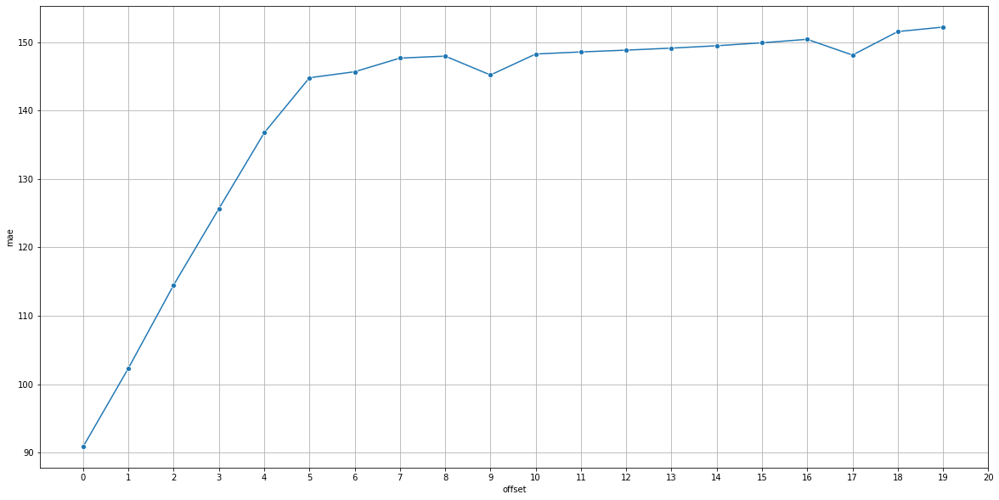

In [235]:
# MAE per offset - not to be confused with the MAE for k=20 (this would be the average of the line below) -> not comparable with the baseline

data = []

for offset, vm in mae_per_offset.items():
    data.append([offset, vm.mean])

mae_distance_df = pd.DataFrame(data, columns=['offset', 'mae'])

fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(x="offset", y="mae", data=mae_distance_df, marker='o', ax=ax)
ax.set_xticks(np.arange(0, 21, 1), minor=False)
ax.grid()

# MAE vs sentence length

In [246]:
stats_df.head()

,speaker,sentence,mae,mse,idx_h5,start_h5,end_h5,start_file,end_file,sex
0,FSLB1,SX284,88.524490,12593.553711,0,0,140,0.0,140.0,female
1,FSLB1,SX284,88.367928,12491.179688,0,1,141,1.0,141.0,female
2,FSLB1,SX284,88.666847,12598.759766,0,2,142,2.0,142.0,female
3,FSLB1,SX284,87.272377,12273.560547,0,3,143,3.0,143.0,female
4,FSLB1,SX284,88.630493,12479.718750,0,4,144,4.0,144.0,female


In [243]:
df_orig = pd.read_csv(Path('audio_datasets') / 'dfs' / 'timit-orig-test.csv')
df_orig.head()

,file_name,file_path,sentence,MFCC_length,mel_spectro_length,raw_length,speaker
0,SX284.WAV,/workspace/data_pa/TIMIT/AUDIO_FILES/ORIGINAL/...,SX284,261,261,52122,FSLB1
1,SA1.WAV,/workspace/data_pa/TIMIT/AUDIO_FILES/ORIGINAL/...,SA1,314,314,62669,FSLB1
2,SX14.WAV,/workspace/data_pa/TIMIT/AUDIO_FILES/ORIGINAL/...,SX14,263,263,52429,FSLB1
3,SI1904.WAV,/workspace/data_pa/TIMIT/AUDIO_FILES/ORIGINAL/...,SI1904,225,225,44954,FSLB1
4,SA2.WAV,/workspace/data_pa/TIMIT/AUDIO_FILES/ORIGINAL/...,SA2,238,238,47412,FSLB1


In [245]:
df_orig['mel_spectro_length'][df_orig['sentence']=='SA1']

1       314
10      320
20      333
30      250
41      321
       ... 
1630    237
1640    319
1650    255
1660    250
1670    286
Name: mel_spectro_length, Length: 168, dtype: int64

In [276]:
sentence, mae, length = [], [], []

for index, row in stats_df.iterrows():
    sentence.append(row['sentence'])
    mae.append(row['mae'])
    length.append(df_orig[(df_orig['sentence']==row['sentence']) & (df_orig['speaker']==row['speaker'])]['mel_spectro_length'].iloc[0])

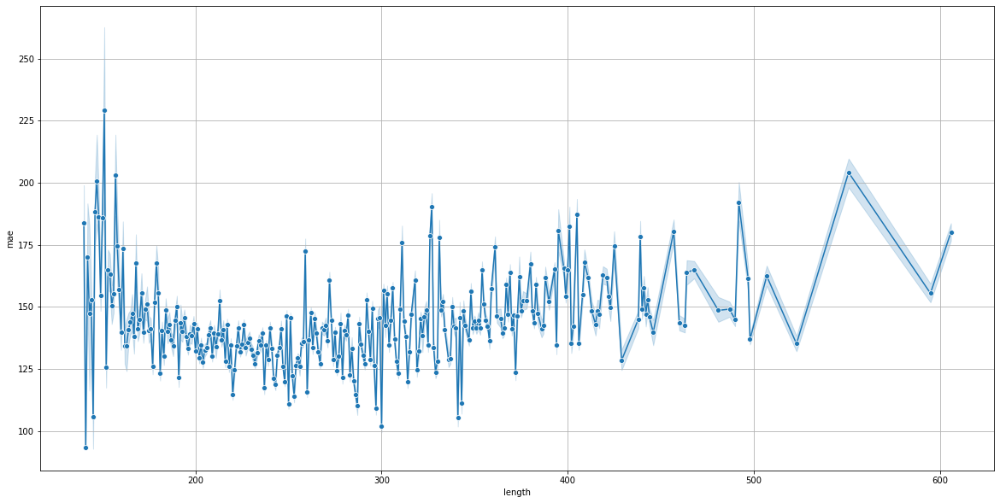

In [278]:
mae_sentence_length_df = pd.DataFrame.from_dict({'sentence': sentence, 'mae': mae, 'length': length})

fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(x="length", y="mae", data=mae_sentence_length_df, marker='o', ax=ax)
ax.grid()

# MAE per speaker

In [7]:
stats_df.groupby(['speaker']).mean().sort_values(by=['mae'])

,mae,mse,idx_h5,start_h5,end_h5
speaker,,,,,
FREW0,118.238655,23757.552439,233.472081,58611.619289,58751.619289
MKLT0,119.350967,24055.166365,135.029985,34197.167916,34337.167916
MCHH0,121.885694,25480.796765,1333.559211,330990.230263,331130.230263
MJTH0,122.266611,25637.169444,1054.790055,260816.817680,260956.817680
MROA0,122.476121,24972.358969,783.889376,193751.623220,193891.623220
...,...,...,...,...,...
FDAC1,161.526343,43214.073387,1284.551662,317762.181042,317902.181042
MJDM1,161.966150,43163.202484,1074.150289,265583.994220,265723.994220
MLLL0,163.118113,44039.376019,644.622256,161154.493565,161294.493565


<AxesSubplot:xlabel='speaker', ylabel='mae'>

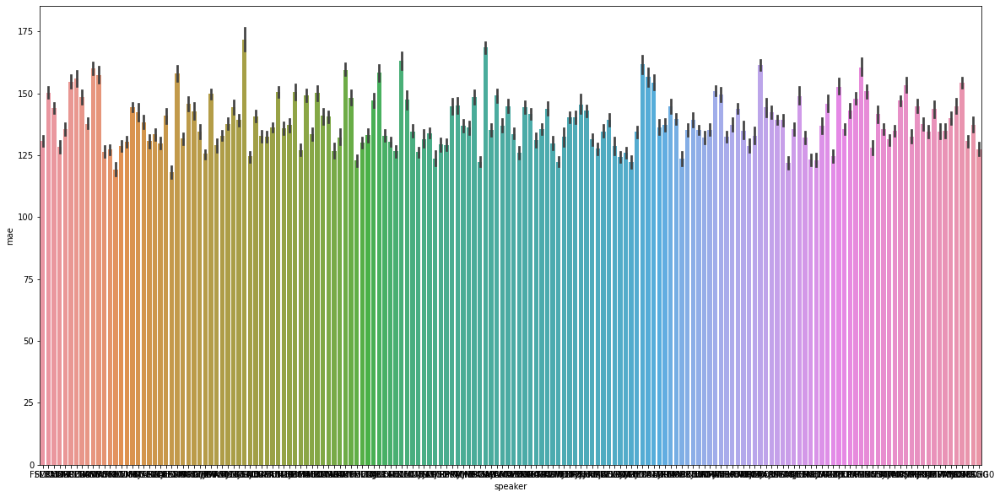

In [8]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.barplot(x="speaker", y="mae", data=stats_df, ax=ax)

# MAE per sentence

In [9]:
stats_df.groupby(['sentence']).mean().sort_values(by=['mae'])

,mae,mse,idx_h5,start_h5,end_h5
sentence,,,,,
SI2210,78.042996,10159.651225,1583.000000,392532.500000,392672.500000
SI1555,91.633073,15519.896636,933.000000,231187.000000,231327.000000
SI2107,98.598993,15365.263945,929.000000,230446.000000,230586.000000
SA1,99.874129,17860.074488,829.191528,205726.328198,205866.328198
SI1214,101.082249,16521.025684,1372.000000,340051.500000,340191.500000
...,...,...,...,...,...
SI1543,248.015736,83428.708154,1099.000000,271660.500000,271800.500000
SI1833,260.278309,87617.372109,341.000000,85453.500000,85593.500000
SI2209,260.372752,82737.510417,161.000000,40859.000000,40999.000000


<AxesSubplot:xlabel='sentence', ylabel='mae'>

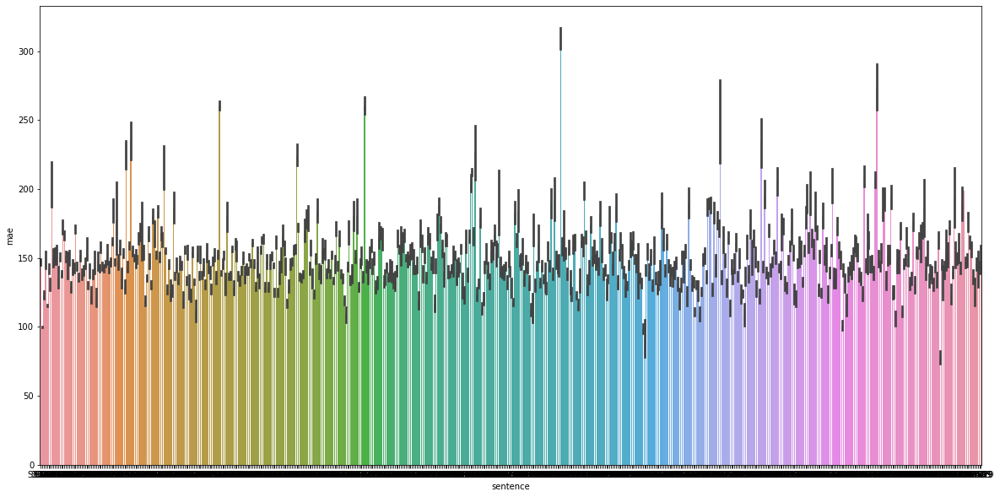

In [10]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.barplot(x="sentence", y="mae", data=stats_df, ax=ax)

# MAE per speaker and sentence

<AxesSubplot:xlabel='mae'>

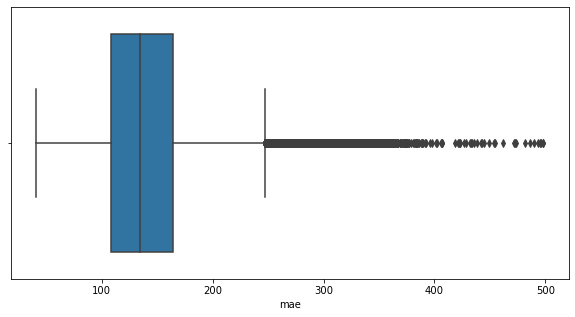

In [11]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", data=stats_df, ax=ax)
# sns.swarmplot(x="mae", data=stats_df, color=".25", ax=ax)

In [136]:
# SA1 seems to be an easy sentence...
stats_df.groupby(['sentence', 'speaker']).mean().sort_values(by=['mae'])

mae            mse  idx_h5  start_h5    end_h5  \
sentence speaker                                                          
SA1      MJTH0     70.776211    8325.949927  1050.0  259753.0  259893.0   
         MSJS1     72.877339    9105.585577   700.0  174019.0  174159.0   
         MCRC0     74.254522    9332.021246   190.0   48023.5   48163.5   
         MRRK0     74.752962    9333.918678  1230.0  304171.5  304311.5   
         MGLB0     75.096451    9560.727367  1410.0  348653.0  348793.0   
...                      ...            ...     ...       ...       ...   
SI2213   MDLF0    274.284141  101912.179253  1448.0  358021.5  358161.5   
SX380    MJSW0    289.958624  109088.148022   367.0   91937.5   92077.5   
SX194    FDRD1    294.117987  115715.653773  1408.0  348295.0  348435.0   
SX12     MMDM2    296.602033  112085.817845   932.0  231020.0  231160.0   
SI1029   MPAM1    309.487188  125739.767578   743.0  183675.5  183815.5   

                  start_file  end_file  
sentence speaker                        
SA1      MJTH0          54.0     194.0  
         MSJS1          30.0     170.0  
         MCRC0          40.5     180.5  
         MRRK0          51.5     191.5  
         MGLB0          45.0     185.0  
...                      ...       ...  
SI2213   MDLF0           8.5     148.5  
SX380    MJSW0          93.5     233.5  
SX194    FDRD1          20.0     160.0  
SX12     MMDM2           9.0     149.0  
SI1029   MPAM1           5.5     145.5  

[1630 rows x 7 columns]

<AxesSubplot:xlabel='sentence', ylabel='mae'>

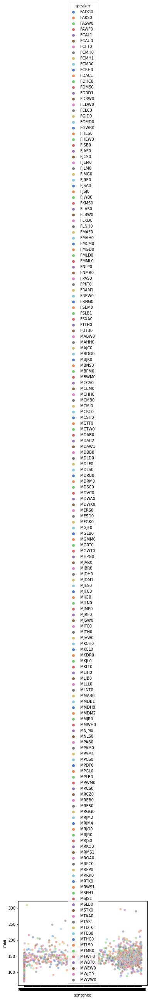

In [205]:
sns.scatterplot(x="sentence", y="mae", hue="speaker",
            sizes=(400, 400), alpha=.5, palette="muted", data=stats_df.groupby(['sentence', 'speaker']).mean())

# Plot and play a Sentence with small MAE

In [156]:
best_sentence = stats_df.groupby(['sentence', 'speaker']).mean().sort_values(by=['mae'])
sentence, speaker = best_sentence.index[0]

print("{}/{}".format(speaker, sentence))

MJTH0/SA1


In [158]:
best_sentence = stats_df.loc[(stats_df['speaker'] == speaker) & (stats_df['sentence'] == sentence)]

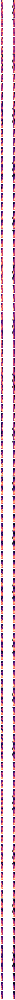

In [168]:
# Plot the best sentence frame-wise

fig, ax = plt.subplots(ncols=2, nrows=len(best_sentence), figsize=(20, 5*len(best_sentence)))

for c, idx in enumerate(list(best_sentence.index)):
    y = gt[idx]
    y_hat = pr[idx]
    
    ax[c, 0].imshow(y.T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[c, 1].imshow(y_hat.T, origin="lower", cmap=plt.get_cmap("magma"))
    
plt.tight_layout()
plt.show()

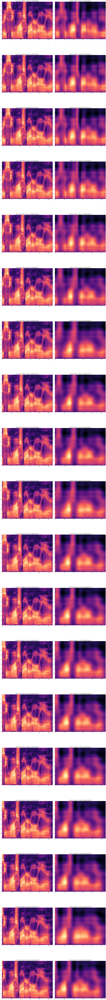

In [183]:
# Plot the best sentence by combining multiple frames (e.g. always use the frame at position "last n + [offset]")

offsets = np.arange(0, 19)

fig, ax = plt.subplots(ncols=2, nrows=len(offsets), figsize=(20, 10*len(offsets)))

for c, offset in enumerate(offsets):
    y, y_hat = [], []
    
    for idx in list(best_sentence.index):
        y.append(gt[idx][offset, :])
        y_hat.append(pr[idx][offset, :])
    
    y = np.array(y)
    y_hat = np.array(y_hat)
    
    mae = mean_absolute_error(y, y_hat)
    
    ax[c, 0].imshow(y.T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[c, 1].imshow(y_hat.T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[c, 0].set_title("Ground Truth, Offset={}, MAE={}".format(offset, mae))
    ax[c, 1].set_title("Prediction, Offset={}, MAE={}".format(offset, mae))
    
plt.tight_layout()
plt.show()

In [195]:
# Play the best sentence by combining multiple frames (e.g. always use the frame at position "last n + [offset]")
offsets = np.arange(0, 19)
mean = conf['data']['stats'][conf['data']['type']]['train']['mean']
std = conf['data']['stats'][conf['data']['type']]['train']['std']
    
for c, offset in enumerate(offsets):
    y, y_hat = [], []
    
    for idx in list(best_sentence.index):
        y.append(gt[idx][offset, :])
        y_hat.append(pr[idx][offset, :])
    
    y = np.array(y)
    y_hat = np.array(y_hat)
    
    y = undo_zero_norm(y, mean, std)
    y_hat = undo_zero_norm(y_hat, mean, std)
    
    y = librosa.db_to_power(y)
    y_hat = librosa.db_to_power(y_hat)
    
    ipd.display(ipd.Audio(mel_to_audio(y.T, hop_length=conf['data']['transform']['hop_length'], sr=conf['data']['transform']['sample_rate'], n_fft=conf['data']['transform']['n_fft']), rate=conf['data']['transform']['sample_rate']))
    ipd.display(ipd.Audio(mel_to_audio(y_hat.T, hop_length=conf['data']['transform']['hop_length'], sr=conf['data']['transform']['sample_rate'], n_fft=conf['data']['transform']['n_fft']), rate=conf['data']['transform']['sample_rate']))


# Plot and Play Sentence with large MAE

In [296]:
best_sentence = stats_df.groupby(['sentence', 'speaker']).mean().sort_values(by=['mae'])
sentence, speaker = best_sentence.index[-14] # the worst 3 are very short...

print("{}/{}".format(speaker, sentence))
bad_sentence = stats_df.loc[(stats_df['speaker'] == speaker) & (stats_df['sentence'] == sentence)]
print(len(bad_sentence))

FJSJ0/SX44
88


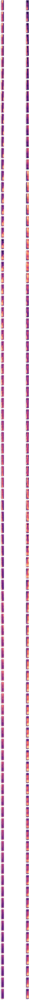

In [297]:
# Plot the worst sentence frame-wise

fig, ax = plt.subplots(ncols=2, nrows=len(bad_sentence), figsize=(20, 3*len(bad_sentence)))

for c, idx in enumerate(list(bad_sentence.index)):
    y = gt[idx]
    y_hat = pr[idx]
    
    ax[c, 0].imshow(y.T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[c, 1].imshow(y_hat.T, origin="lower", cmap=plt.get_cmap("magma"))
    
plt.tight_layout()
plt.show()

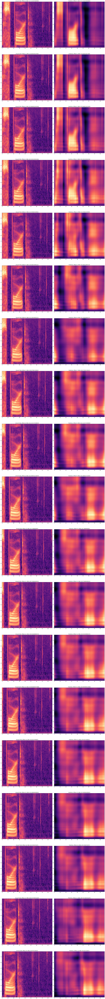

In [298]:
# Plot the worst sentence by combining multiple frames (e.g. always use the frame at position "last n + [offset]")

offsets = np.arange(0, 19)

fig, ax = plt.subplots(ncols=2, nrows=len(offsets), figsize=(20, 10*len(offsets)))

for c, offset in enumerate(offsets):
    y, y_hat = [], []
    
    for idx in list(bad_sentence.index):
        y.append(gt[idx][offset, :])
        y_hat.append(pr[idx][offset, :])
    
    y = np.array(y)
    y_hat = np.array(y_hat)
    
    mae = mean_absolute_error(y, y_hat)
    
    ax[c, 0].imshow(y.T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[c, 1].imshow(y_hat.T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[c, 0].set_title("Ground Truth, Offset={}, MAE={}".format(offset, mae))
    ax[c, 1].set_title("Prediction, Offset={}, MAE={}".format(offset, mae))
    
plt.tight_layout()
plt.show()

In [299]:
# Play the worst sentence by combining multiple frames (e.g. always use the frame at position "last n + [offset]")
offsets = np.arange(0, 19)
mean = conf['data']['stats'][conf['data']['type']]['train']['mean']
std = conf['data']['stats'][conf['data']['type']]['train']['std']
    
for c, offset in enumerate(offsets):
    y, y_hat = [], []
    
    for idx in list(bad_sentence.index):
        y.append(gt[idx][offset, :])
        y_hat.append(pr[idx][offset, :])
    
    y = np.array(y)
    y_hat = np.array(y_hat)
    
    y = undo_zero_norm(y, mean, std)
    y_hat = undo_zero_norm(y_hat, mean, std)
    
    y = librosa.db_to_power(y)
    y_hat = librosa.db_to_power(y_hat)
    
    ipd.display(ipd.Audio(mel_to_audio(y.T, hop_length=conf['data']['transform']['hop_length'], sr=conf['data']['transform']['sample_rate'], n_fft=conf['data']['transform']['n_fft']), rate=conf['data']['transform']['sample_rate']))
    ipd.display(ipd.Audio(mel_to_audio(y_hat.T, hop_length=conf['data']['transform']['hop_length'], sr=conf['data']['transform']['sample_rate'], n_fft=conf['data']['transform']['n_fft']), rate=conf['data']['transform']['sample_rate']))


In [29]:
for index, row in stats_df.iterrows():
    speaker = row['speaker']
    if speaker.startswith('F'):
        sex = 'female'
    elif speaker.startswith('M'):
        sex = 'male'
    else:
        sex = 'undefined'
    
    stats_df.loc[index, 'sex'] = sex

In [31]:
stats_df.head()

,speaker,sentence,mae,mse,idx_h5,start_h5,end_h5,start_file,end_file,sex
0,FSLB1,SX284,88.524490,12593.553711,0,0,140,0.0,140.0,female
1,FSLB1,SX284,88.367928,12491.179688,0,1,141,1.0,141.0,female
2,FSLB1,SX284,88.666847,12598.759766,0,2,142,2.0,142.0,female
3,FSLB1,SX284,87.272377,12273.560547,0,3,143,3.0,143.0,female
4,FSLB1,SX284,88.630493,12479.718750,0,4,144,4.0,144.0,female


<AxesSubplot:xlabel='mae', ylabel='sex'>

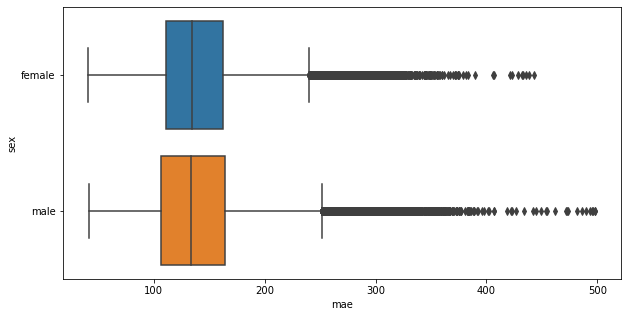

In [32]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='sex', data=stats_df, ax=ax)

In [41]:
speaker_infos = open("audio_datasets/dfs/timit-speakers-info.txt","r+")
speaker_infos = speaker_infos.readlines()

In [42]:
len(speaker_infos)

630

In [43]:
speaker_infos

['ABC0  M  6  TRN  03/03/86  06/17/60  5\'11"  WHT  BS\n',
 'ABW0  M  2  TST  04/21/86  05/26/59  5\'9"   WHT  BS\n',
 'ADC0  M  3  TRN  02/25/86  04/27/54  5\'9"   WHT  HS\n',
 'ADD0  M  7  TRN  01/28/86  03/23/58  6\'2"   WHT  BS\n',
 'ADG0  F  4  TST  02/12/86  04/11/59  5\'4"   WHT  MS\n',
 'AEB0  M  4  TRN  04/10/86  09/20/37  5\'11"  WHT  HS\n',
 'AEM0  F  2  TRN  02/27/86  05/13/60  5\'3"   WHT  BS\n',
 'AEO0  M  7  TRN  02/20/86  07/19/55  5\'11"  WHT  BS\n',
 'AFM0  M  7  TRN  03/31/86  12/22/52  5\'08"  WHT  BS\n',
 'AHH0  M  5  TST  02/14/86  02/22/53  5\'10"  BLK  BS\n',
 'AJC0  M  8  TST  03/11/86  12/25/58  6\'00"  WHT  BS\n',
 'AJP0  M  6  TRN  05/06/86  08/23/63  5\'11"  WHT  BS\n',
 'AJW0  F  2  TRN  02/11/86  03/31/58  5\'8"   WHT  HS\n',
 'AKB0  M  3  TRN  04/16/86  09/18/51  6\'0"   WHT  MS\n',
 'AKR0  M  3  TRN  02/24/86  04/09/63  6\'0"   WHT  MS\n',
 'AKS0  F  1  TST  04/01/86  12/05/57  5\'04"  WHT  PHD\n',
 'ALK0  F  3  TRN  01/28/86  07/23/38  5\'6"   WHT  HS\

In [121]:
def height_to_cm(height):
    h_ft = int(height.split('\'')[0])
    h_inch = int(height.split('\'')[1].replace('"', ''))
    h_inch += h_ft * 12
    h_cm = round(h_inch * 2.54, 1)
    return h_cm

id_, sex, dialect, use, rec_date, birth_date, height, race, education, comments = [], [], [], [], [], [], [], [], [], []
for speaker_info in speaker_infos:
    si = speaker_info.replace("\n", "")
    si = list(filter(None, si.split()))
    id_.append(si[1] + si[0])
    sex.append(si[1])
    dialect.append(si[2])
    use.append(si[3])
    rec_date.append(pd.to_datetime(si[4]))
    try:
        birth_date.append(pd.to_datetime(si[5]))
    except Exception:
        birth_date.append(None)
    height.append(height_to_cm(si[6]))
    race.append(si[7])
    education.append(si[8])
    if len(si) >= 10:
        comments.append(" ".join(si[9:]))
    else:
        comments.append(None)

In [122]:
speaker_infos_df = pd.DataFrame.from_dict({
    'speaker': id_,
    'sex': sex,
    'dialect': dialect,
    'use': use,
    'recording date': rec_date,
    'birth date': birth_date,
    'height': height,
    'race': race,
    'education': education,
    'comments': comments
})

speaker_infos_df.head()

,speaker,sex,dialect,use,recording date,birth date,height,race,education,comments
0,MABC0,M,6,TRN,1986-03-03,2060-06-17,180.3,WHT,BS,None
1,MABW0,M,2,TST,1986-04-21,2059-05-26,175.3,WHT,BS,None
2,MADC0,M,3,TRN,1986-02-25,2054-04-27,175.3,WHT,HS,None
3,MADD0,M,7,TRN,1986-01-28,2058-03-23,188.0,WHT,BS,None
4,FADG0,F,4,TST,1986-02-12,2059-04-11,162.6,WHT,MS,None


In [123]:
# Binning

speaker_infos_df['height'] = pd.cut(speaker_infos_df['height'], bins=[150, 160, 170, 180, 190, 200])

In [124]:
speaker_infos_df.head()

,speaker,sex,dialect,use,recording date,birth date,height,race,education,comments
0,MABC0,M,6,TRN,1986-03-03,2060-06-17,"(180, 190]",WHT,BS,None
1,MABW0,M,2,TST,1986-04-21,2059-05-26,"(170, 180]",WHT,BS,None
2,MADC0,M,3,TRN,1986-02-25,2054-04-27,"(170, 180]",WHT,HS,None
3,MADD0,M,7,TRN,1986-01-28,2058-03-23,"(180, 190]",WHT,BS,None
4,FADG0,F,4,TST,1986-02-12,2059-04-11,"(160, 170]",WHT,MS,None


In [125]:
stats_df.groupby('speaker').mean().head()

,mae,mse,idx_h5,start_h5,end_h5,start_file,end_file
speaker,,,,,,,
FADG0,140.740666,33489.587254,384.647619,95985.519048,96125.519048,67.638095,207.638095
FAKS0,147.089145,36028.293641,1534.087432,380371.653005,380511.653005,80.858607,220.858607
FASW0,168.658922,47818.376920,794.159436,196557.661605,196697.661605,104.237527,244.237527
FAWF0,128.525805,28472.451459,34.011848,9298.146919,9438.146919,58.144550,198.144550
FCAL1,147.210550,36917.657260,594.708566,148991.990689,149131.990689,65.880819,205.880819


In [126]:
speaker_infos_df.set_index('speaker').head()

,sex,dialect,use,recording date,birth date,height,race,education,comments
speaker,,,,,,,,,
MABC0,M,6,TRN,1986-03-03,2060-06-17,"(180, 190]",WHT,BS,None
MABW0,M,2,TST,1986-04-21,2059-05-26,"(170, 180]",WHT,BS,None
MADC0,M,3,TRN,1986-02-25,2054-04-27,"(170, 180]",WHT,HS,None
MADD0,M,7,TRN,1986-01-28,2058-03-23,"(180, 190]",WHT,BS,None
FADG0,F,4,TST,1986-02-12,2059-04-11,"(160, 170]",WHT,MS,None


In [127]:
stats_speaker_df = pd.merge(stats_df.groupby('speaker').mean(), speaker_infos_df.set_index('speaker'), left_index=True, right_index=True)

In [128]:
stats_speaker_df.head()

,mae,mse,idx_h5,start_h5,end_h5,start_file,end_file,sex,dialect,use,recording date,birth date,height,race,education,comments
speaker,,,,,,,,,,,,,,,,
FADG0,140.740666,33489.587254,384.647619,95985.519048,96125.519048,67.638095,207.638095,F,4,TST,1986-02-12,2059-04-11,"(160, 170]",WHT,MS,None
FAKS0,147.089145,36028.293641,1534.087432,380371.653005,380511.653005,80.858607,220.858607,F,1,TST,1986-04-01,2057-12-05,"(160, 170]",WHT,PHD,None
FASW0,168.658922,47818.376920,794.159436,196557.661605,196697.661605,104.237527,244.237527,F,5,TST,1986-03-26,2031-01-06,"(160, 170]",WHT,??,"LOW PITCH VOICE, A SOUTHERN ""LADY"""
FAWF0,128.525805,28472.451459,34.011848,9298.146919,9438.146919,58.144550,198.144550,F,5,TST,1986-04-14,2058-12-19,"(170, 180]",WHT,BS,None
FCAL1,147.210550,36917.657260,594.708566,148991.990689,149131.990689,65.880819,205.880819,F,5,TST,1986-02-28,2056-01-20,"(160, 170]",WHT,HS,None


<AxesSubplot:xlabel='mae', ylabel='sex'>

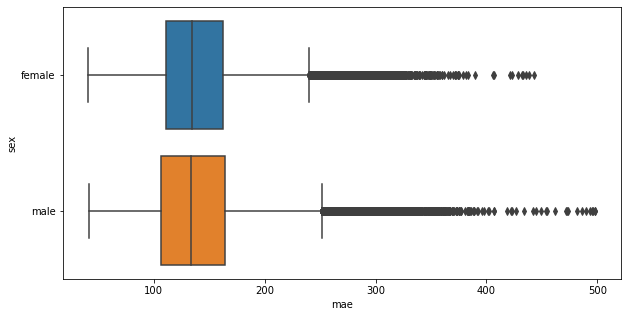

In [129]:
# per speaker and sentence
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='sex', data=stats_df, ax=ax)

<AxesSubplot:xlabel='mae', ylabel='sex'>

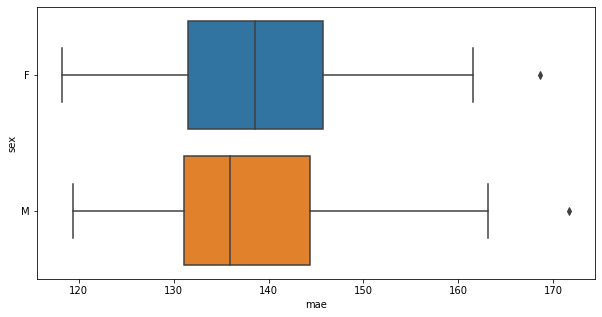

In [130]:
# average per speaker
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='sex', data=stats_speaker_df, ax=ax)

<AxesSubplot:xlabel='mae', ylabel='dialect'>

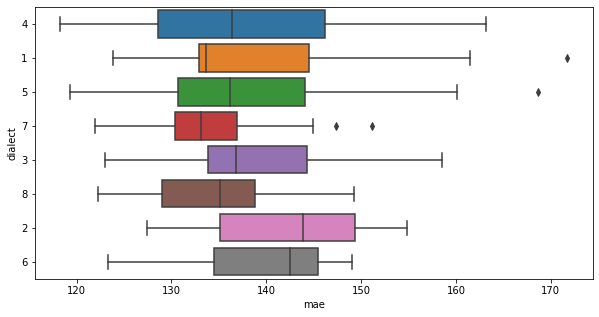

In [131]:
# average per speaker
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='dialect', data=stats_speaker_df, ax=ax)

<AxesSubplot:xlabel='mae', ylabel='height'>

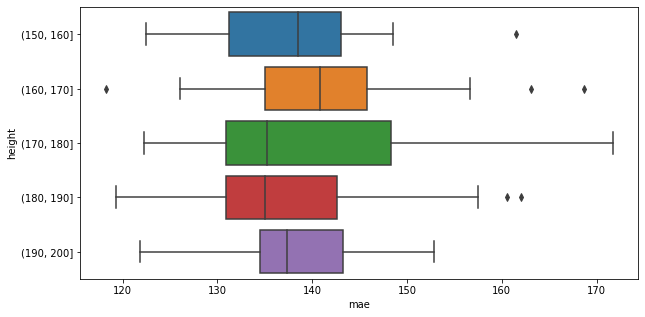

In [132]:
# average per speaker
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='height', data=stats_speaker_df, ax=ax)

<AxesSubplot:xlabel='mae', ylabel='race'>

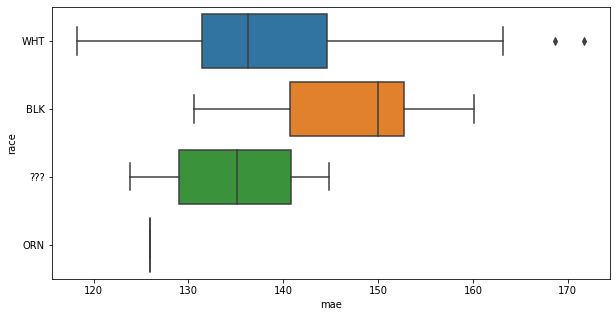

In [133]:
# average per speaker
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='race', data=stats_speaker_df, ax=ax)

<AxesSubplot:xlabel='mae', ylabel='education'>

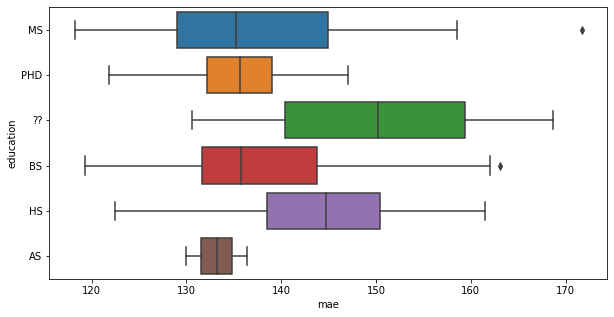

In [134]:
# average per speaker
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='education', data=stats_speaker_df, ax=ax)

<AxesSubplot:xlabel='mae', ylabel='comments'>

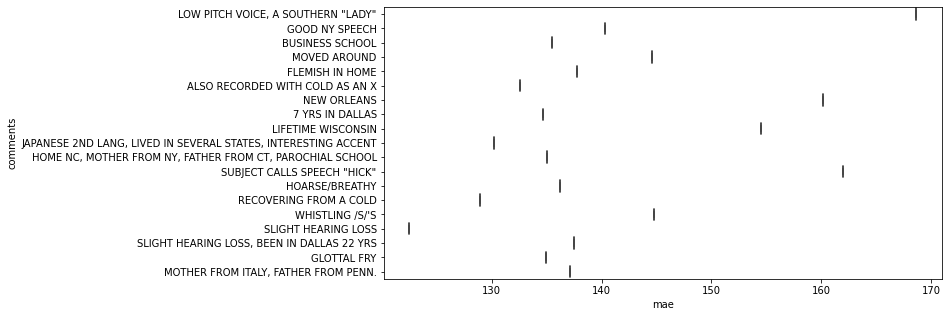

In [135]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x="mae", y='comments', data=stats_speaker_df, ax=ax)

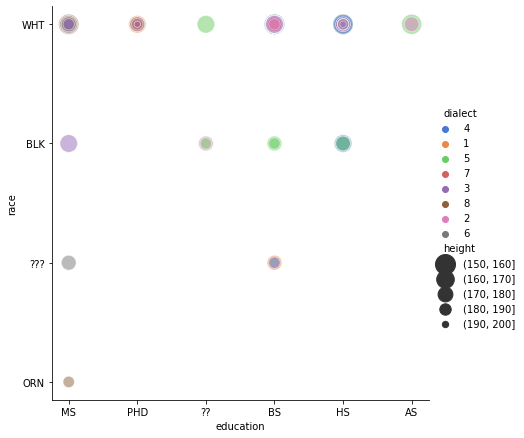

In [199]:
sns.relplot(x="education", y="race", hue="dialect", size="height",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=stats_speaker_df)

In [12]:
f = open(Path('audio_datasets')/ 'dfs' / "allphonetime.txt", "r")
phonetime = f.read()

In [13]:
phonetime = phonetime.split('\n')
phonetime = [pt.replace('\t', ' ').split(' ') for pt in phonetime]

In [14]:
phonetime_dict = {}
for pt in phonetime:
    try:
        file_name = str(pt[0].split('/')[-2]) + "/" + str(pt[0].split('/')[-1])
    except:
        print(pt)
    phonetime_dict[file_name] = []
    for i in range(1, len(pt)-1, 3):
        phonetime_dict[file_name].append((pt[i], int(pt[i+1]), int(pt[i+2])))
    
phonetime_dict

['']


{'mabc0/sa1': [('h#', 0, 2560),
  ('sh', 2560, 4130),
  ('iy', 4130, 4678),
  ('hv', 4678, 5389),
  ('ae', 5389, 7000),
  ('zh', 7000, 8313),
  ('ax-h', 8313, 8791),
  ('dcl', 8791, 9170),
  ('d', 9170, 9660),
  ('aa', 9660, 10973),
  ('r', 10973, 11720),
  ('kcl', 11720, 12519),
  ('s', 12519, 14470),
  ('ux', 14470, 16280),
  ('dx', 16280, 16680),
  ('ix', 16680, 17528),
  ('n', 17528, 18560),
  ('gcl', 18560, 19540),
  ('g', 19540, 20070),
  ('r', 20070, 20596),
  ('iy', 20596, 21650),
  ('s', 21650, 23160),
  ('ix', 23160, 24062),
  ('w', 24062, 25399),
  ('aa', 25399, 27530),
  ('sh', 27530, 28400),
  ('epi', 28400, 29280),
  ('w', 29280, 29906),
  ('uh', 29906, 30754),
  ('dx', 30754, 31160),
  ('axr', 31160, 32626),
  ('ao', 32626, 33963),
  ('l', 33963, 34757),
  ('y', 34757, 36200),
  ('ih', 36200, 37514),
  ('axr', 37514, 38920),
  ('h#', 38920, 43360)],
 'mabc0/sa2': [('h#', 0, 2230),
  ('d', 2230, 2480),
  ('ow', 2480, 4120),
  ('nx', 4120, 4520),
  ('ae', 4520, 6900),
  ('

In [15]:
def frame_idx_to_time(idx):
    start = 0 + 200*idx
    end = 0 + 200*idx
    return (start, end)

def frame_to_phone(file_, idx):
    pt = phonetime_dict[file_]
    start, end = frame_idx_to_time(idx)
    for p in pt:
        if start >= p[1] and end <= p[2]:
            return p[0]
    return '*'


C:\Users\paess\Anaconda3\envs\temporal-speech-context\lib\site-packages\torch\functional.py:516: UserWarning: stft will require the return_complex parameter be explicitly  specified in a future PyTorch release. Use return_complex=False  to preserve the current behavior or return_complex=True to return  a complex output. (Triggered internally at  ..\aten\src\ATen\native\SpectralOps.cpp:653.)
  normalized, onesided, return_complex)
C:\Users\paess\Anaconda3\envs\temporal-speech-context\lib\site-packages\torch\functional.py:516: UserWarning: The function torch.rfft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.fft or torch.fft.rfft. (Triggered internally at  ..\aten\src\ATen\native\SpectralOps.cpp:590.)
  normalized, onesided, return_complex)


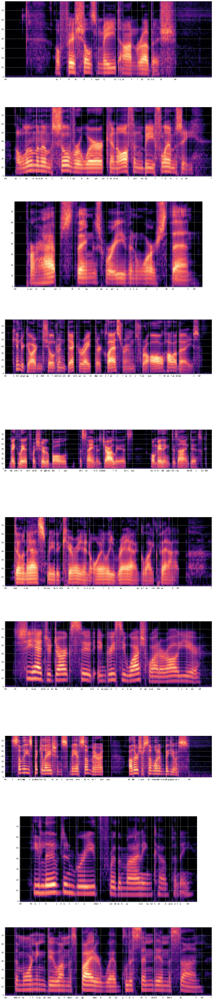

In [16]:
n_plots = 10

fig, ax = plt.subplots(nrows=n_plots, figsize=(20, 10*n_plots))

df_orig = pd.read_csv(Path('audio_datasets') / 'dfs' / 'timit-orig-test.csv')
f = h5py.File('D:/Projekte/temporal-speech-context/data/TIMIT/timit_raw_test-128.h5', 'r')

mel_spectro_transform = get_mel_spectro_transform(conf)
to_db = torchaudio.transforms.AmplitudeToDB()

for i in range(n_plots):
    idx = random.randint(0, 1681)

    start_idx, end_idx = f['META'][idx]
    raw = f['RAW'][:, start_idx:end_idx]
    speaker = df_orig['speaker'][idx]
    sentence = df_orig['sentence'][idx]
    
    raw = undo_zero_norm(raw, mean=0.00000020026256208893756, std=0.004097380209714174)
    mel = to_db(mel_spectro_transform(torch.as_tensor(raw)))
    
    ax[i].imshow(mel.squeeze(), origin="lower", cmap=plt.get_cmap("magma"))

    last_phone = None
    ticks, ticks_label = [], []
    for j in range(mel.shape[2]):
        phone = frame_to_phone('{}/{}'.format(speaker.lower(), sentence.lower()), j)
        if phone != last_phone:
            ticks.append(j)
            ticks_label.append(phone)
            last_phone = phone

    ax[i].set_xticks(ticks, minor=False)
    ax[i].set_xticklabels(ticks_label, fontdict=None, minor=False)
    ax[i].grid()
    
plt.show()

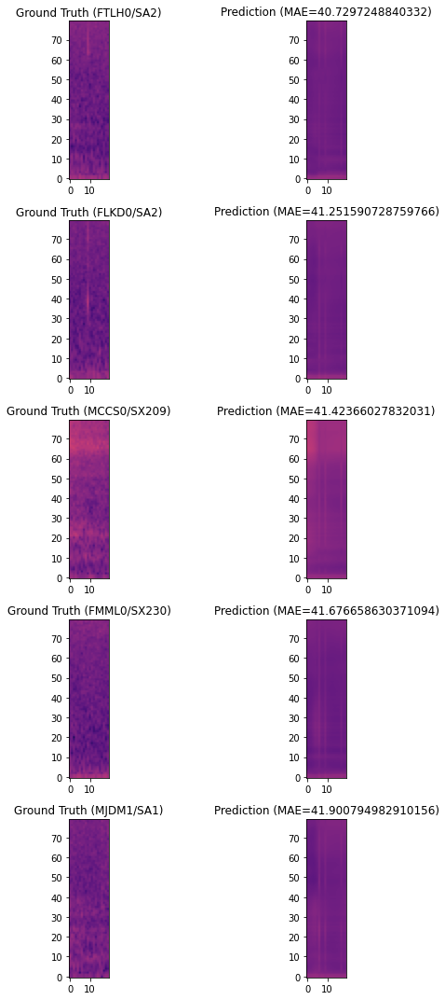

In [28]:
# Plot best spectros

n_plots, i = 5, 0
titles = []
count = 0
stats_df_sorted = stats_df.sort_values(by=['mae']).reset_index(drop=False)

fig, ax = plt.subplots(ncols=2, nrows=n_plots, figsize=(10, 3*n_plots))

while i < n_plots:
    title = "{}/{}".format(stats_df_sorted['speaker'][count], stats_df_sorted['sentence'][count])
    
    if title not in titles:
        index = stats_df_sorted['index'][count]
        vmin, vmax = min(np.min(gt), np.min(pr)), max(np.max(gt), np.max(pr))
        ax[i, 0].imshow(gt[index].squeeze().T, origin="lower", cmap=plt.get_cmap("magma"), vmin=vmin, vmax=vmax)
        ax[i, 1].imshow(pr[index].squeeze().T, origin="lower", cmap=plt.get_cmap("magma"), vmin=vmin, vmax=vmax)
        ax[i, 0].set_title("Ground Truth ({})".format(title))
        ax[i, 1].set_title("Prediction (MAE={})".format(mean_absolute_error(gt[index].squeeze(), pr[index].squeeze())))
        titles.append(title)
        i += 1
    
    count += 1
    
plt.tight_layout()
    
    
    


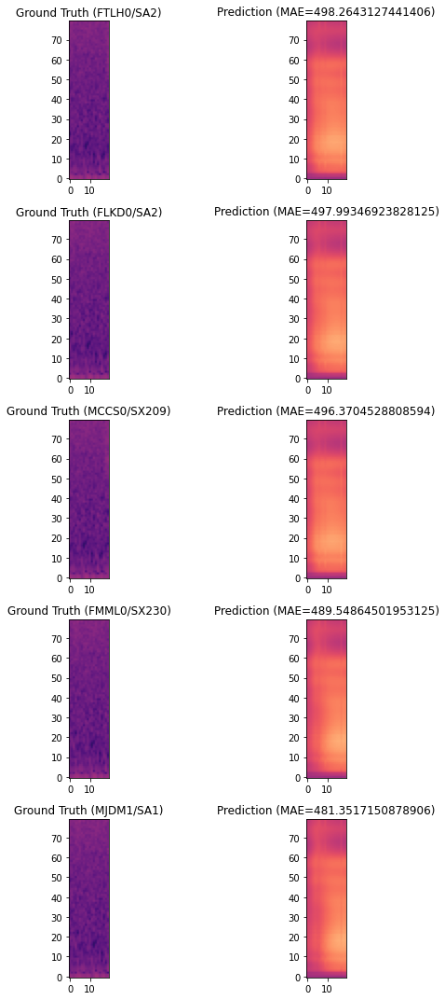

In [27]:
# Plot worst spectros

n_plots, i = 5, 0
titles = []
count = 0
stats_df_sorted = stats_df.sort_values(by=['mae']).reset_index(drop=False)

fig, ax = plt.subplots(ncols=2, nrows=n_plots, figsize=(10, 3*n_plots))

while i < n_plots:
    title = "{}/{}".format(stats_df_sorted['speaker'][count], stats_df_sorted['sentence'][count])
    
    if title not in titles:
        index = stats_df_sorted['index'][len(stats_df_sorted)-1-count]
        vmin, vmax = min(np.min(gt), np.min(pr)), max(np.max(gt), np.max(pr))
        ax[i, 0].imshow(gt[index].squeeze().T, origin="lower", cmap=plt.get_cmap("magma"), vmin=vmin, vmax=vmax)
        ax[i, 1].imshow(pr[index].squeeze().T, origin="lower", cmap=plt.get_cmap("magma"), vmin=vmin, vmax=vmax)
        ax[i, 0].set_title("Ground Truth ({})".format(title))
        ax[i, 1].set_title("Prediction (MAE={})".format(mean_absolute_error(gt[index].squeeze(), pr[index].squeeze())))
        titles.append(title)
        i += 1
    
    count += 1
    
plt.tight_layout()

In [19]:
sum_file_lengths = {} # mapping from idx_h5 to length of all files till this idx

for index, row in df_orig.iterrows():
    sum_file_lengths[index] = row['mel_spectro_length']
    if index > 0:
        sum_file_lengths[index] += sum_file_lengths[index-1]
        
for index, row in stats_df.iterrows():
    idx_h5 = row['idx_h5']
    sum_file_length = sum_file_lengths[idx_h5-1] if idx_h5 > 0 else 0
    stats_df.loc[index, 'start_file'] = row['start_h5'] - sum_file_length
    stats_df.loc[index, 'end_file'] = row['end_h5'] - sum_file_length

In [20]:
stats_df.head()

,speaker,sentence,mae,mse,idx_h5,start_h5,end_h5,start_file,end_file
0,FSLB1,SX284,88.524490,12593.553711,0,0,140,0.0,140.0
1,FSLB1,SX284,88.367928,12491.179688,0,1,141,1.0,141.0
2,FSLB1,SX284,88.666847,12598.759766,0,2,142,2.0,142.0
3,FSLB1,SX284,87.272377,12273.560547,0,3,143,3.0,143.0
4,FSLB1,SX284,88.630493,12479.718750,0,4,144,4.0,144.0


In [21]:
mae_per_phone = {}
for i in tqdm(range(len(stats_df))):
    
    file_ = "{}/{}".format(stats_df['speaker'][i].lower(), stats_df['sentence'][i].lower())
    start_file, end_file = stats_df['start_file'][i], stats_df['end_file'][i]
    
    for j in range(gt[i].shape[0]):
#         print('i={}, j={}, phone_idx={}'.format(i, j, int(start_file)+conf['masking']['n_frames']+j))
        phone = frame_to_phone(file_, int(start_file)+conf['masking']['n_frames']+j)
        
        phone_mae = mean_absolute_error(gt[i][j, :], pr[i][j, :])
        
        if phone not in mae_per_phone:
            mae_per_phone[phone] = AverageValueMeter()
        
        mae_per_phone[phone].add(phone_mae)
    
for phone, error_vm in mae_per_phone.items():
    print('{}:   {}'.format(phone, error_vm.mean))
    


ey:   125.36026429714289
v:   117.67313979091311
axr:   108.87258408160511
ax:   115.50242893071115
ix:   111.48928250093736
s:   160.88860947228713
eh:   137.48242668179645
n:   118.18555820083385
tcl:   220.2776964559049
t:   143.16551586570304
f:   135.09975595444718
y:   98.45841654545075
ux:   106.6465156602506
dcl:   212.26882171078313
jh:   163.74606256472572
pcl:   252.65003105878716
p:   121.91216671850505
er:   120.82335494953637
ch:   170.6006310223574
ax-h:   140.71348822805987
h#:   169.7390866711625
q:   152.06040900896562
gcl:   183.99213424784955
g:   119.92222756368078
r:   121.6343491353643
iy:   112.82999747842231
w:   104.82446510881752
aa:   122.0484968067244
sh:   150.18179574766424
epi:   144.51830005835626
ao:   105.30459392833043
dx:   112.76645309763386
l:   110.53283227272337
ih:   116.3362916971346
m:   116.64313930157579
pau:   216.11382033056412
uw:   113.83780727906782
hh:   119.07957487751581
ah:   123.885085455245
uh:   127.63585288512243
kcl:   221.49

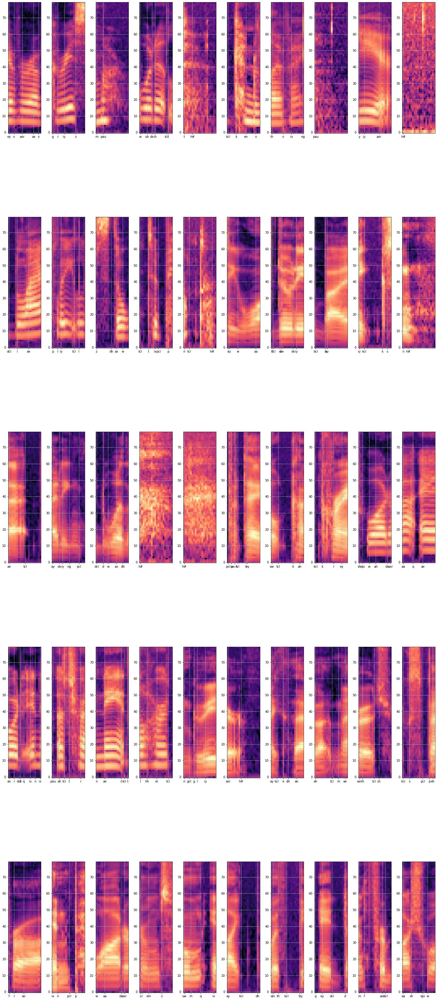

In [22]:
# check if correct

phone_maes = []
fig, ax = plt.subplots(nrows=5, ncols=10, figsize=(20, 50))

for count, i in tqdm(enumerate(range(0, 7500, 150))):
    
    file_ = "{}/{}".format(stats_df['speaker'][i].lower(), stats_df['sentence'][i].lower())
    start_file, end_file = stats_df['start_file'][i], stats_df['end_file'][i]
    
    last_phone = None
    ticks, ticks_label = [], []
    
    for j in range(gt[i].shape[0]):
        phone = frame_to_phone(file_, int(start_file)+conf['masking']['n_frames']+j)
        
        phone_mae = mean_absolute_error(gt[i][j, :], pr[i][j, :])
        phone_maes.append(phone_mae)
        
        if phone != last_phone:
            ticks.append(j)
            ticks_label.append(phone)
            last_phone = phone
        
        
    ax[count//10, count%10].imshow(gt[i].T, origin="lower", cmap=plt.get_cmap("magma"))
    ax[count//10, count%10].set_xticks(ticks, minor=False)
    ax[count//10, count%10].set_xticklabels(ticks_label, fontdict=None, minor=False)
    ax[count//10, count%10].grid()
    

plt.tight_layout()
plt.show()


In [23]:
# Stops:   
#                   b          bee           BCL B iy
#                   d          day           DCL D ey
#                   g          gay           GCL G ey 
#                   p          pea           PCL P iy
#                   t          tea           TCL T iy
#                   k          key           KCL K iy
#                   dx         muddy, dirty  m ah DX iy, dcl d er DX iy
#                   q          bat           bcl b ae Q

#   Affricates:
#                   jh         joke          DCL JH ow kcl k
#                   ch         choke         TCL CH ow kcl k

#   Fricatives:
#                   s          sea           S iy
#                   sh         she           SH iy
#                   z          zone          Z ow n
#                   zh         azure         ae ZH er
#                   f          fin           F ih n
#                   th         thin          TH ih n
#                   v          van           V ae n 
#                   dh         then          DH e n

#   Nasals:
#                   m          mom           M aa M
#                   n          noon          N uw N
#                   ng         sing          s ih NG
#                   em         bottom        b aa tcl t EM
#                   en         button        b ah q EN
#                   eng        washington    w aa sh ENG tcl t ax n
#                   nx         winner        w ih NX axr
                                
#   Semivowels and
#   Glides:
#                   l          lay           L ey
#                   r          ray           R ey
#                   w          way           W ey
#                   y          yacht         Y aa tcl t
#                   hh         hay           HH ey
#                   hv         ahead         ax HV eh dcl d
#                   el         bottle        bcl b aa tcl t EL
                  

#   Vowels:
#                   iy         beet          bcl b IY tcl t
#                   ih         bit           bcl b IH tcl t 
#                   eh         bet           bcl b EH tcl t
#                   ey         bait          bcl b EY tcl t
#                   ae         bat           bcl b AE tcl t
#                   aa         bott          bcl b AA tcl t
#                   aw         bout          bcl b AW tcl t
#                   ay         bite          bcl b AY tcl t
#                   ah         but           bcl b AH tcl t
#                   ao         bought        bcl b AO tcl t
#                   oy         boy           bcl b OY
#                   ow         boat          bcl b OW tcl t
#                   uh         book          bcl b UH kcl k
#                   uw         boot          bcl b UW tcl t
#                   ux         toot          tcl t UX tcl t
#                   er         bird          bcl b ER dcl d
#                   ax         about         AX bcl b aw tcl t
#                   ix         debit         dcl d eh bcl b IX tcl t
#                   axr        butter        bcl b ah dx AXR
#                   ax-h       suspect       s AX-H s pcl p eh kcl k tcl t
                    
#   Others:
#                 SYMBOL    DESCRIPTION
#                 ------    -----------
#                   pau     pause
#                   epi     epenthetic silence
#                   h#      begin/end marker (non-speech events)
#                   1       primary stress marker
#                   2       secondary stress marker

phone_catalog = {
    '1_stops_closure': ['bcl','dcl','gcl','pcl','tck','kcl'],
    '2_stops': ['b', 'd', 'g', 'p', 't', 'k', 'dx', 'q'],
    '3_affricatives_closure': ['dcl', 'tcl'],
    '4_affricatives': ['jh', 'ch'],
    '5_fricatives': ['s', 'sh', 'z', 'zh', 'f', 'th', 'v', 'dh'],
    '6_nasals': ['m', 'n', 'ng', 'em', 'en', 'eng', 'nx'],
    '7_semivowels_and_glides': ['l', 'r', 'w', 'y', 'hh', 'hv', 'el'],
    '8_vowels': ['iy', 'ih', 'eh', 'ey', 'ae', 'aa', 'aw', 'ay', 'ah', 'ao', 'oy', 'ow', 'uh', 'uw', 'ux', 'er', 'ax', 'ix', 'axr', 'ax-h'],
    '9_others': ['pau', 'epi', 'h#', '1', '2', '*'],
}

phone_catalog_inv = {}
for cat, pho in phone_catalog.items():
    for p in pho:
        phone_catalog_inv[p] = cat

phone_catalog_inv

{'bcl': '1_stops_closure',
 'dcl': '3_affricatives_closure',
 'gcl': '1_stops_closure',
 'pcl': '1_stops_closure',
 'tck': '1_stops_closure',
 'kcl': '1_stops_closure',
 'b': '2_stops',
 'd': '2_stops',
 'g': '2_stops',
 'p': '2_stops',
 't': '2_stops',
 'k': '2_stops',
 'dx': '2_stops',
 'q': '2_stops',
 'tcl': '3_affricatives_closure',
 'jh': '4_affricatives',
 'ch': '4_affricatives',
 's': '5_fricatives',
 'sh': '5_fricatives',
 'z': '5_fricatives',
 'zh': '5_fricatives',
 'f': '5_fricatives',
 'th': '5_fricatives',
 'v': '5_fricatives',
 'dh': '5_fricatives',
 'm': '6_nasals',
 'n': '6_nasals',
 'ng': '6_nasals',
 'em': '6_nasals',
 'en': '6_nasals',
 'eng': '6_nasals',
 'nx': '6_nasals',
 'l': '7_semivowels_and_glides',
 'r': '7_semivowels_and_glides',
 'w': '7_semivowels_and_glides',
 'y': '7_semivowels_and_glides',
 'hh': '7_semivowels_and_glides',
 'hv': '7_semivowels_and_glides',
 'el': '7_semivowels_and_glides',
 'iy': '8_vowels',
 'ih': '8_vowels',
 'eh': '8_vowels',
 'ey': 

<AxesSubplot:xlabel='phone mae', ylabel='phone'>

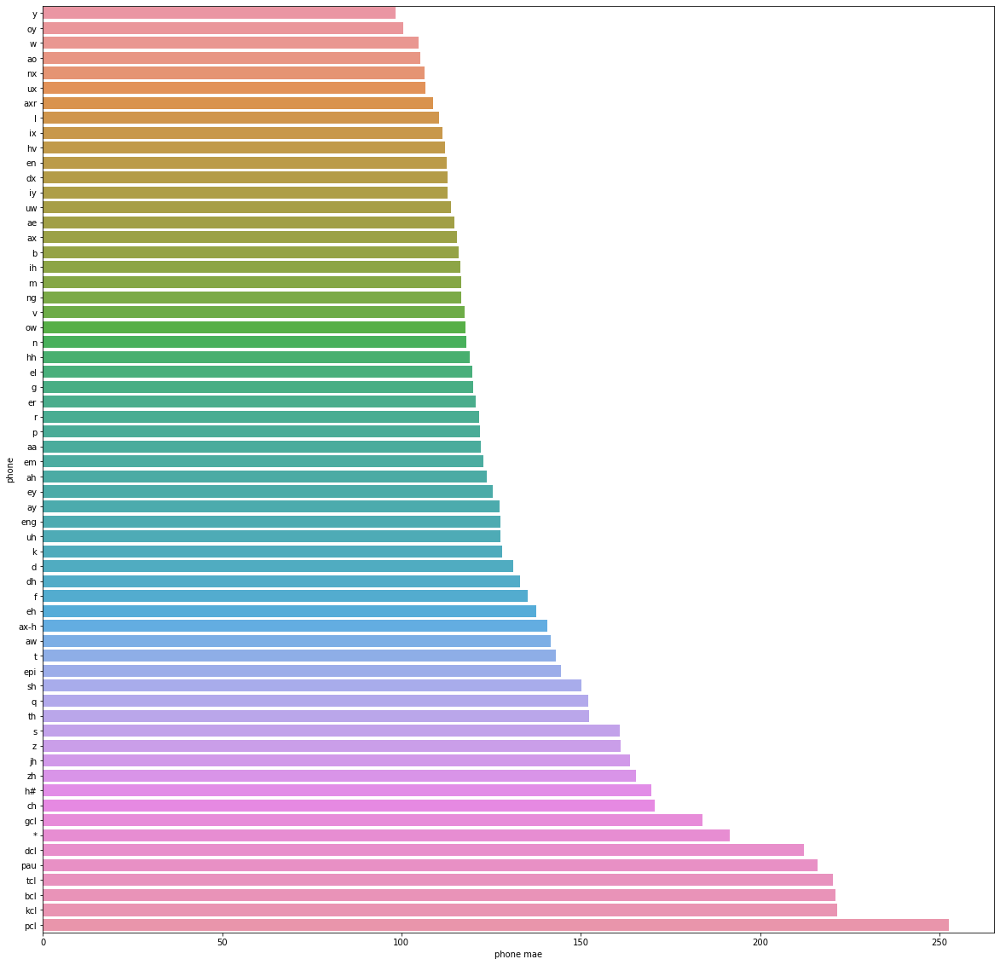

In [24]:
mae_per_phone_sorted = dict(sorted(mae_per_phone.items(), key=lambda item: item[1].mean))
(phones, phones_mae) = zip(*mae_per_phone_sorted.items())

cat = []
for ph in phones:
    cat.append(phone_catalog_inv[ph])


phone_mae = pd.DataFrame.from_dict({'phone': phones, 'categories': cat, 'phone mae': [ph.mean for ph in phones_mae], 'phone mae std': [ph.std for ph in phones_mae]})

fig, ax = plt.subplots(figsize=(20, 20))
sns.barplot(x="phone mae", y="phone", data=phone_mae, ax=ax)

<AxesSubplot:xlabel='phone mae', ylabel='phone'>

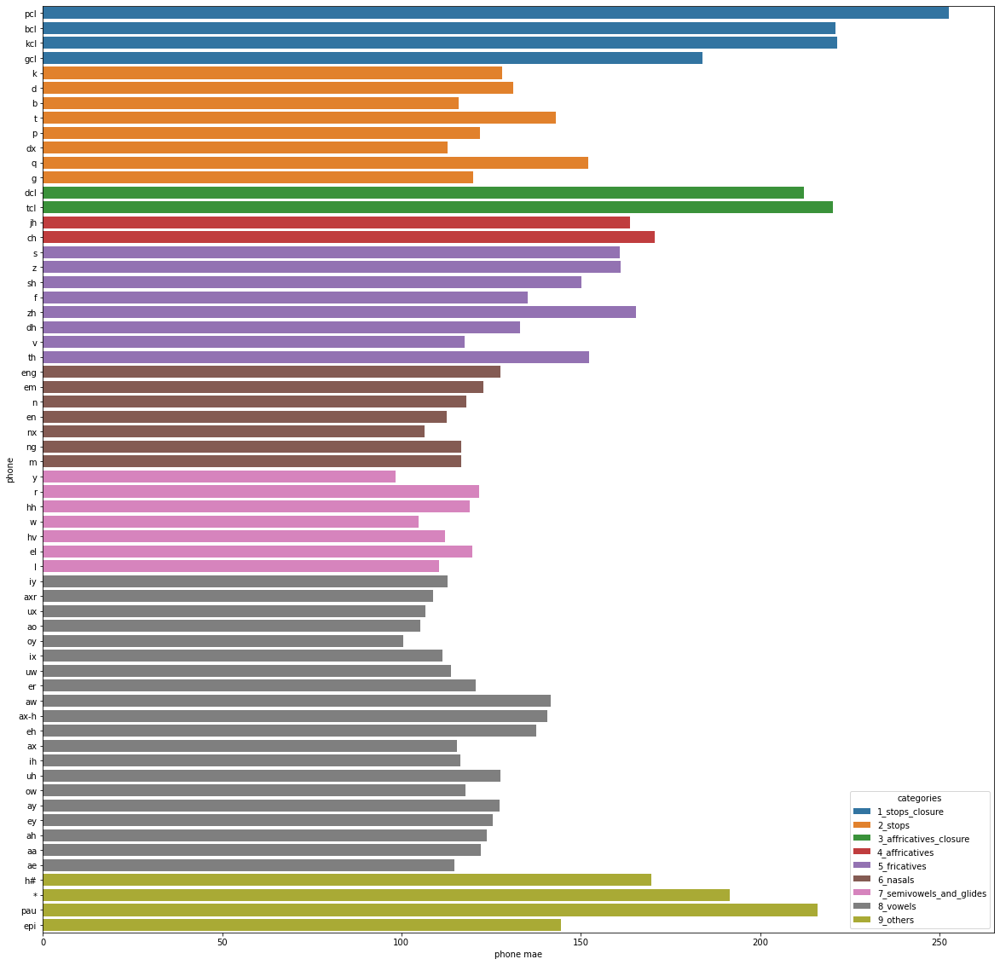

In [25]:
fig, ax = plt.subplots(figsize=(20, 20))
sns.barplot(x="phone mae", y="phone", hue="categories", data=phone_mae.sort_values(by='categories'), ax=ax, dodge=False)